In [1]:
import pandas as pd
import numpy as np
import math
import statistics
import scipy as sp
from scipy import stats

In [2]:
data = pd.read_excel("FoodPrices.xlsx")
data

,Average meal prices at restaurants in Gettysburg ($),Average meal prices at restaurants in Wilma ($)
0,9,11.0
1,5,10.0
2,6,12.0
3,11,9.0
4,8,8.0
5,5,13.0
6,7,14.0
7,13,15.0
8,12,12.0
9,13,11.0


# 3 ways of cleaning data ( removing NaN)
* 1. pandas seriese data type
    - .dropna()
* 2. numpy array data type
    - wdata= wdata[np.logical_not(np.isnan(wdata))]
* 3. numpy array daya type
    - wdata = wdata[~np.isnan(wdata)]

In [3]:
type(data["Average meal prices at restaurants in Wilma ($)"])

pandas.core.series.Series

In [4]:
wdata_p= data["Average meal prices at restaurants in Wilma ($)"].dropna()
wdata_p

0     11.0
1     10.0
2     12.0
3      9.0
4      8.0
5     13.0
6     14.0
7     15.0
8     12.0
9     11.0
10    13.0
11     8.0
12     9.0
13    11.0
Name: Average meal prices at restaurants in Wilma ($), dtype: float64

In [5]:
gdata_p= data["Average meal prices at restaurants in Gettysburg ($)"]
gdata_p

0      9
1      5
2      6
3     11
4      8
5      5
6      7
7     13
8     12
9     13
10     9
11     8
12    10
13     6
14    11
15     9
16     7
17    12
Name: Average meal prices at restaurants in Gettysburg ($), dtype: int64

In [6]:
gdata=data["Average meal prices at restaurants in Gettysburg ($)"].values
gdata

array([ 9,  5,  6, 11,  8,  5,  7, 13, 12, 13,  9,  8, 10,  6, 11,  9,  7,
       12], dtype=int64)

In [7]:
wdata=data["Average meal prices at restaurants in Wilma ($)"].values
wdata

array([11., 10., 12.,  9.,  8., 13., 14., 15., 12., 11., 13.,  8.,  9.,
       11., nan, nan, nan, nan])

In [8]:
wdata= wdata[np.logical_not(np.isnan(wdata))]
wdata

array([11., 10., 12.,  9.,  8., 13., 14., 15., 12., 11., 13.,  8.,  9.,
       11.])

In [9]:
wdata = wdata[~np.isnan(wdata)]
wdata

array([11., 10., 12.,  9.,  8., 13., 14., 15., 12., 11., 13.,  8.,  9.,
       11.])

In [10]:
xbarg = sum(gdata)/len(gdata)
xbarg 

8.944444444444445

In [11]:
xbarw=sum(wdata)/len(wdata)
xbarw

11.142857142857142

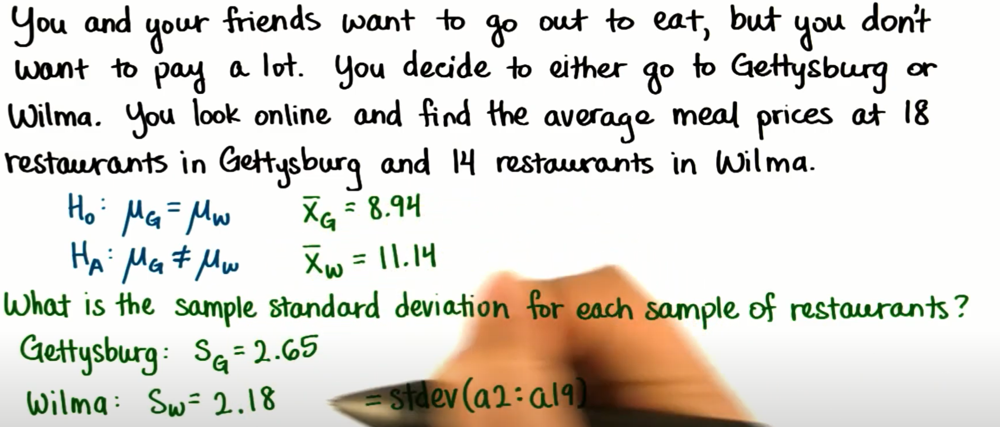

# Bessel's correction
* Bessel's correction is the use of **n − 1 instead of n in the formula** for the sample variance and sample standard deviation, where **n is the number of observations in a sample.**
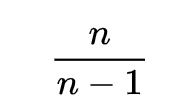

# pandas and numpy standard deviation
*  Pandas uses Bessel's correction (Delta Degrees of Freedom =1 as default) by default. https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.std.html 

* Numpy : Delta Degrees of Freedom is 0 as default. https://numpy.org/doc/stable/reference/generated/numpy.std.html. Need to set "ddof = 1" for Bessel's correction(standard deviation). 

# numpy

In [12]:
gdata.std(ddof=1)

2.6451336499586917

In [13]:
wdata.std(ddof=1)

2.178819117607689

In [14]:
np.std(gdata, ddof=1)

2.6451336499586917

In [15]:
np.std(wdata,ddof=1)

2.178819117607689

# pandas

In [16]:
gdata_p.std()

2.6451336499586917

In [17]:
wdata_p.std()

2.1788191176076888

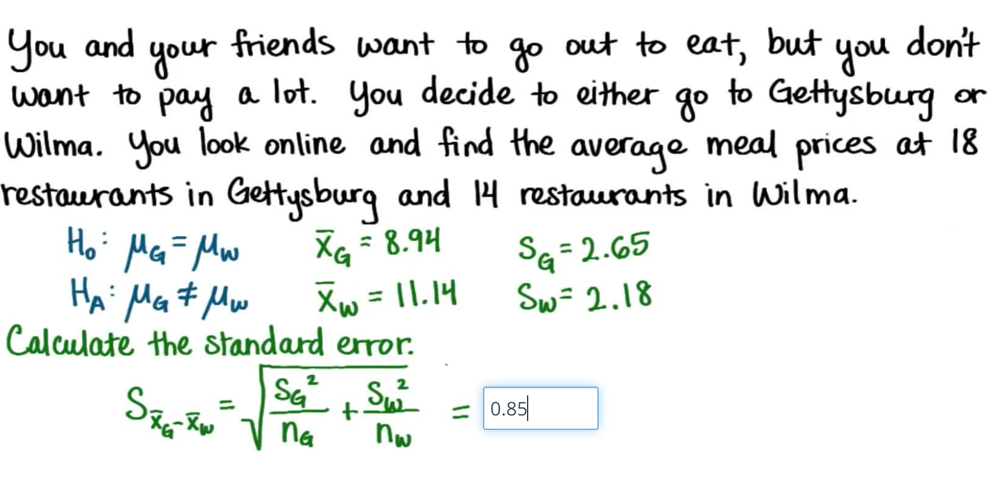

In [18]:
sigma_diff = math.sqrt((gdata.std(ddof=1)**2)/len(gdata) + ((wdata.std(ddof=1)**2)/len(wdata)))
sigma_diff

0.8531100847677228

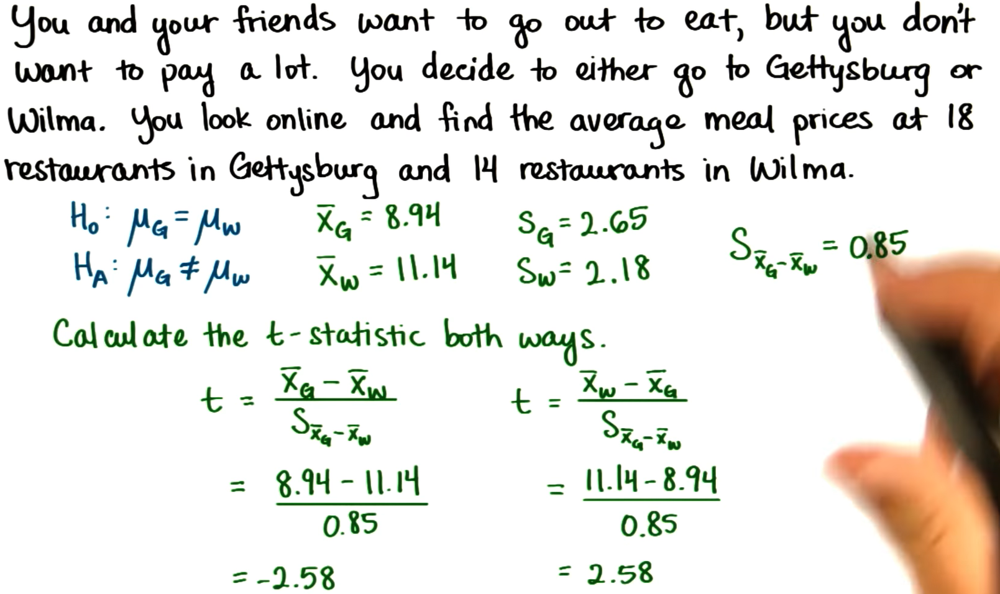

In [19]:
(xbarw-xbarg)/sigma_diff

2.576939058235681

In [20]:
(xbarg-xbarw)/sigma_diff

-2.576939058235681

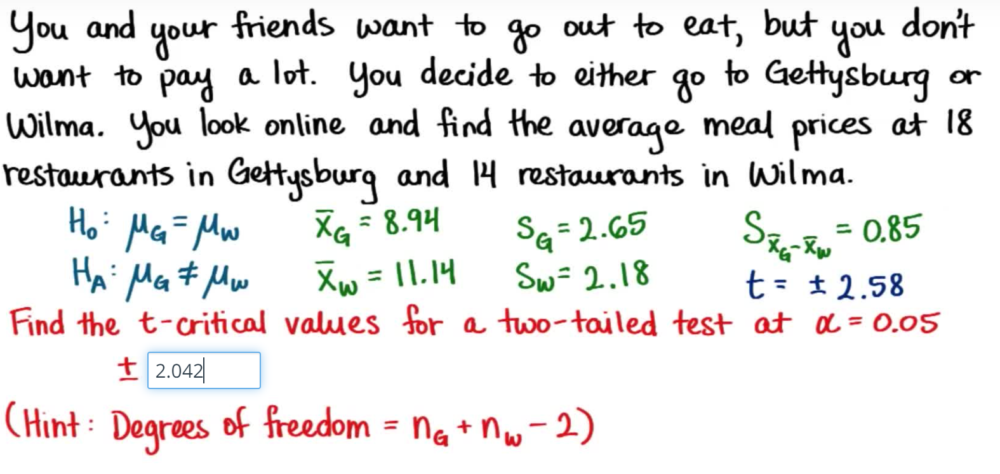

In [25]:
df=len(wdata)+len(gdata)-2
df

30

* t-table https://s3.amazonaws.com/udacity-hosted-downloads/t-table.jpg

In [26]:
t_critical=2.042
t_critical

2.042

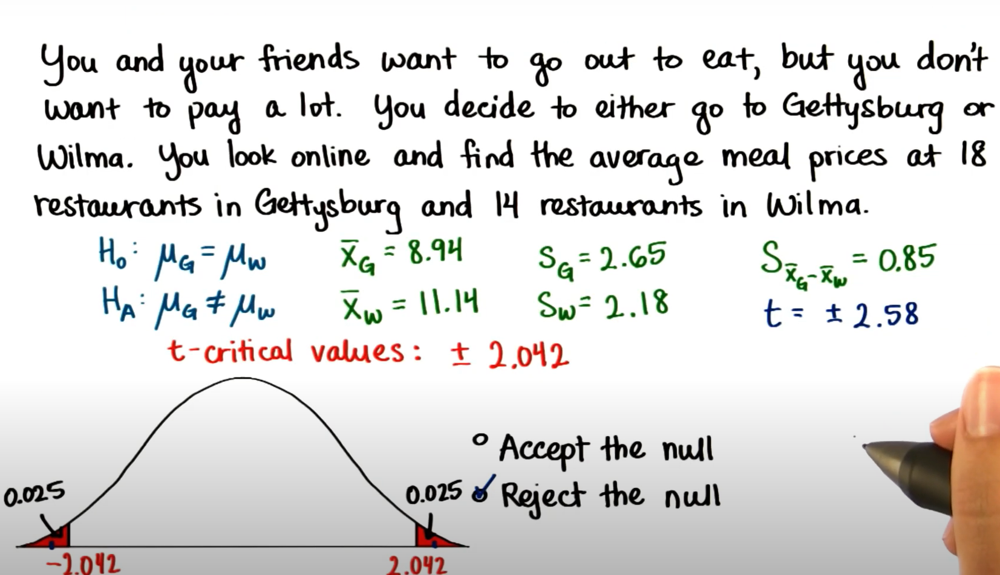

In [2]:
druga=np.array([40,36,20,32,45,28])
druga

array([40, 36, 20, 32, 45, 28])

In [3]:
drugb=np.array([41,39,18,23,35])
drugb

array([41, 39, 18, 23, 35])

In [4]:
druga_xbar = sum(druga)/len(druga)
druga_xbar

33.5

In [5]:
drugb_xbar = sum(drugb)/len(drugb)
drugb_xbar

31.2

In [41]:
%precision 3

'%.3f'

In [39]:
np.set_printoptions(precision=3)

In [42]:
sd_a=druga.std(ddof=1)
sd_a

8.893818077743664

In [14]:
type(sd_a)

numpy.float64

In [29]:
sd_a1=np.round(sd_a, decimals=3)
sd_a1

8.894

In [35]:
sd_ab = np.array([sd_a, sd_b])
sd_ab

array([ 8.894, 10.159])

In [27]:
sd_ab[0]

8.893818077743664

In [23]:
sd_a

8.893818077743664

In [24]:
sd_b 

10.158740079360236

In [9]:
sd_a=8.89

In [20]:
sd_b=drugb.std(ddof=1)
sd_b

10.158740079360236

In [11]:
sd_b = 10.16

In [12]:
sd_diff =druga_xbar - drugb_xbar
sd_diff

2.3000000000000007

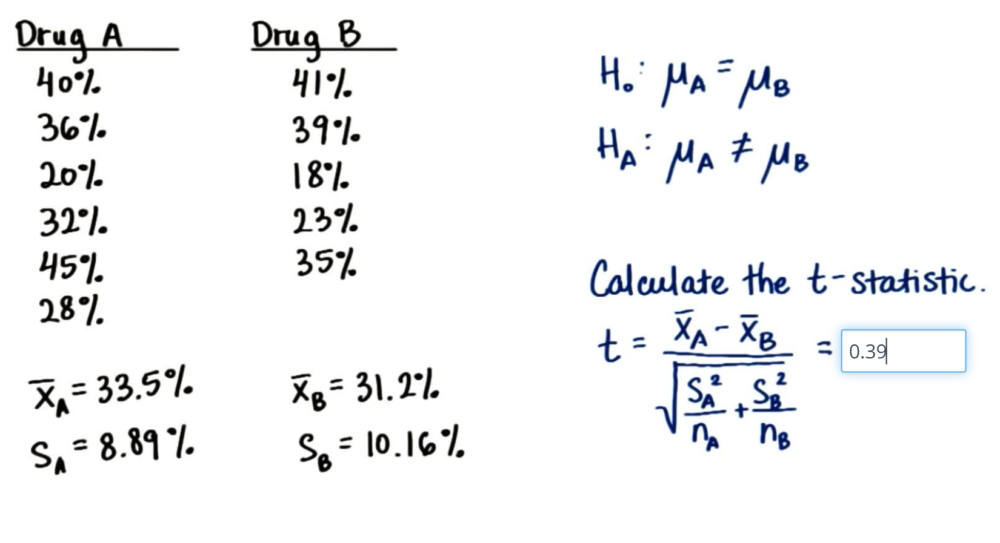

In [43]:
t=sd_diff/(math.sqrt((sd_a**2/len(druga))+(sd_b**2/len(drugb))))
t

0.39551177686805394

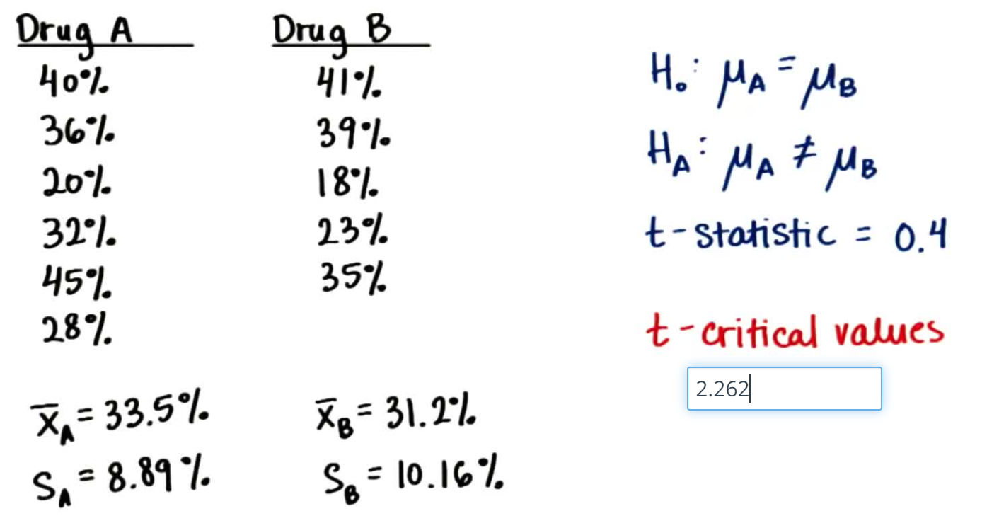

In [45]:
df=len(druga)+len(drugb)-2
df

9

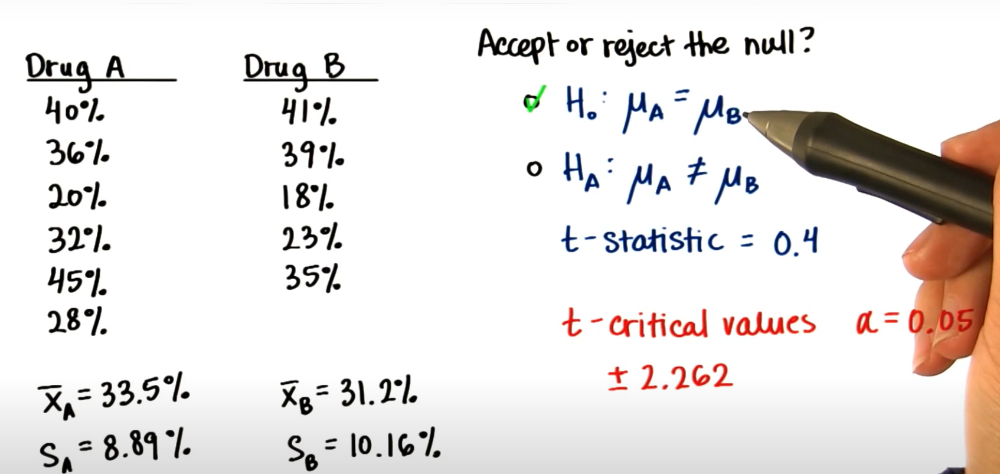

# 2 drungs does not have a significant difference in their effects on acne.

In [2]:
shoe = pd.read_excel("Shoes.xlsx")
shoe

,Pairs of shoes (females),Pairs of shoes (males)
0,90.0,4.0
1,28.0,120.0
2,30.0,5.0
3,10.0,3.0
4,5.0,10.0
5,9.0,3.0
6,60.0,5.0
7,NaN,13.0
8,NaN,4.0
9,NaN,10.0


# remove nan

In [3]:
shoe_f =shoe["Pairs of shoes (females)"].dropna()
shoe_f 

0    90.0
1    28.0
2    30.0
3    10.0
4     5.0
5     9.0
6    60.0
Name: Pairs of shoes (females), dtype: float64

In [4]:
shoe_m =shoe["Pairs of shoes (males)"].dropna()
shoe_m 

0       4.0
1     120.0
2       5.0
3       3.0
4      10.0
5       3.0
6       5.0
7      13.0
8       4.0
9      10.0
10     21.0
Name: Pairs of shoes (males), dtype: float64

# xbar and sd

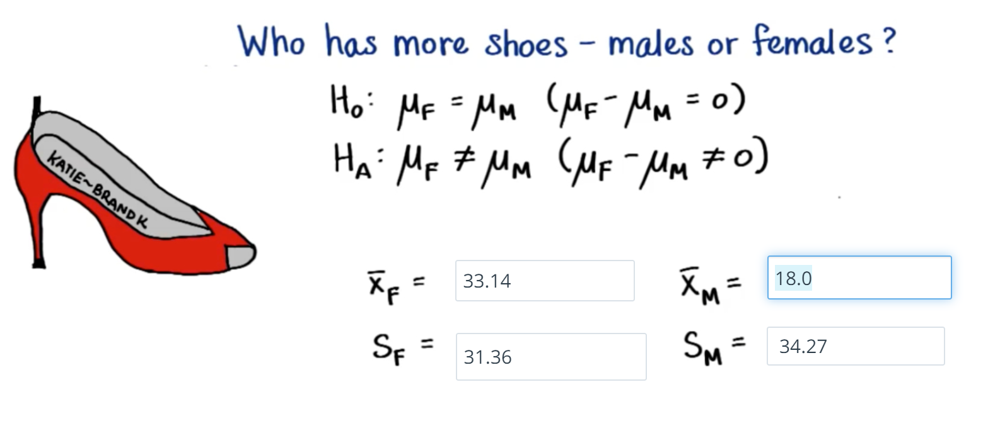

In [5]:
shoe_f_xbar =sum(shoe_f)/len(shoe_f)
shoe_f_xbar 

33.142857142857146

In [16]:
shoe_f_xbar  =np.round(shoe_f_xbar ,decimals=2)
shoe_f_xbar 

33.14

In [6]:
shoe_m_xbar =sum(shoe_m)/len(shoe_m)
shoe_m_xbar 

18.0

In [7]:
shoe_f_sd = shoe_f.std(ddof=1)
shoe_f_sd

31.360423952430722

In [8]:
shoe_f_sd = shoe_f.std()
shoe_f_sd

31.360423952430722

In [9]:
shoe_m_sd = shoe_m.std()
shoe_m_sd

34.27243790569909

In [14]:
shoe_m_sd =np.round(shoe_m_sd,decimals=2)
shoe_m_sd

34.27

In [15]:
shoe_f_sd =np.round(shoe_f_sd,decimals=2)
shoe_f_sd

31.36

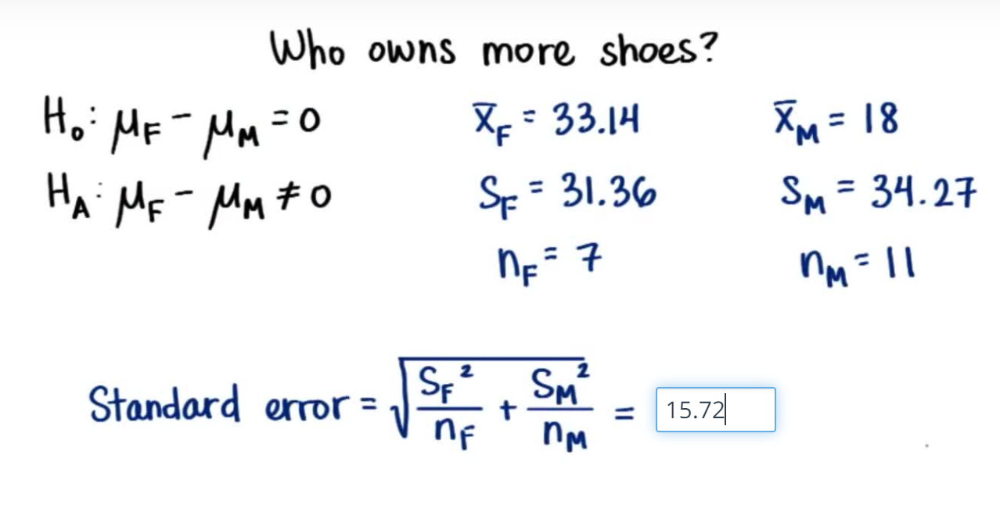

In [18]:
standard_err=math.sqrt((shoe_f_sd **2/len(shoe_f))+(shoe_m_sd **2/len(shoe_m)))
standard_err=np.round(standard_err,decimals=2)
standard_err

15.72

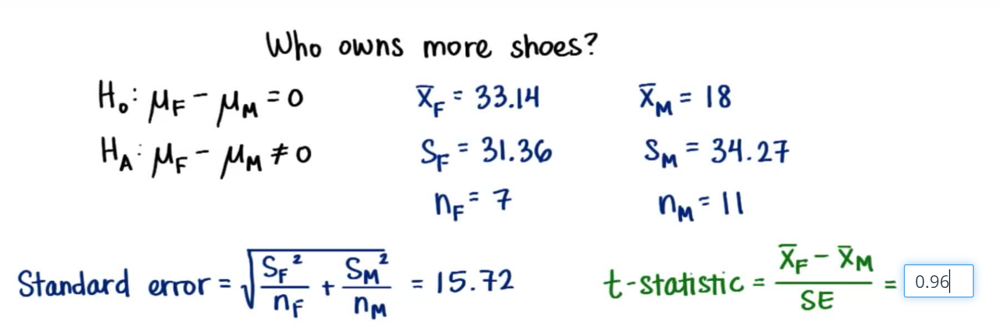

In [19]:
t_stats = np.round(((shoe_f_xbar - shoe_m_xbar)/standard_err),decimals=2)
t_stats

0.96

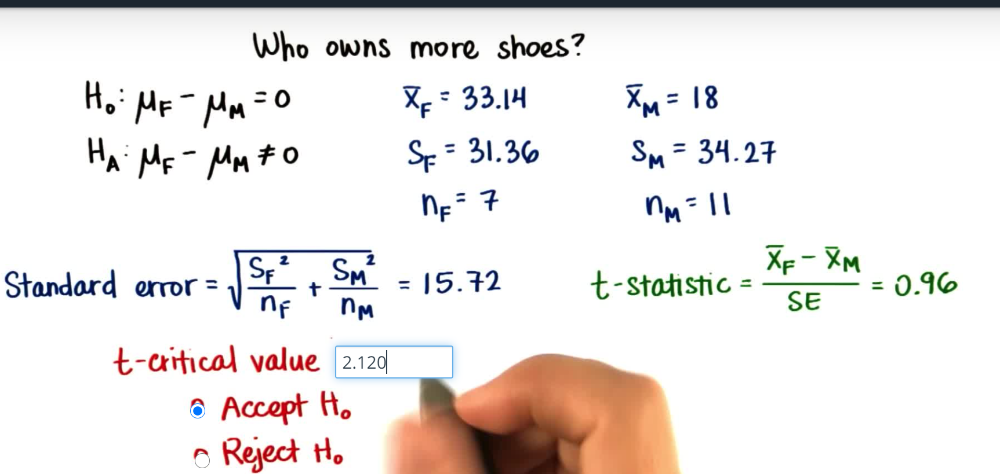

In [20]:
df=len(shoe_f)+len(shoe_m)-2
df

16

In [21]:
t_critical=2.120
t_critical

2.12

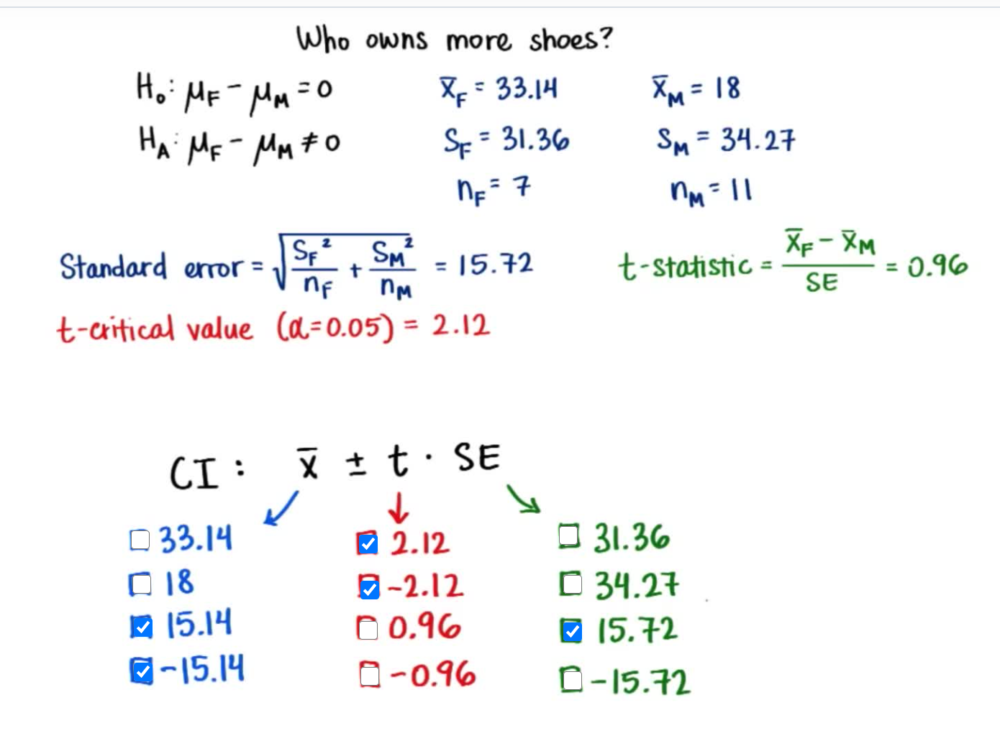

* The t-value in our confidence interval calculations should be **the t-critical value, not the t-statistic.**
* SE(standard error) is never negative


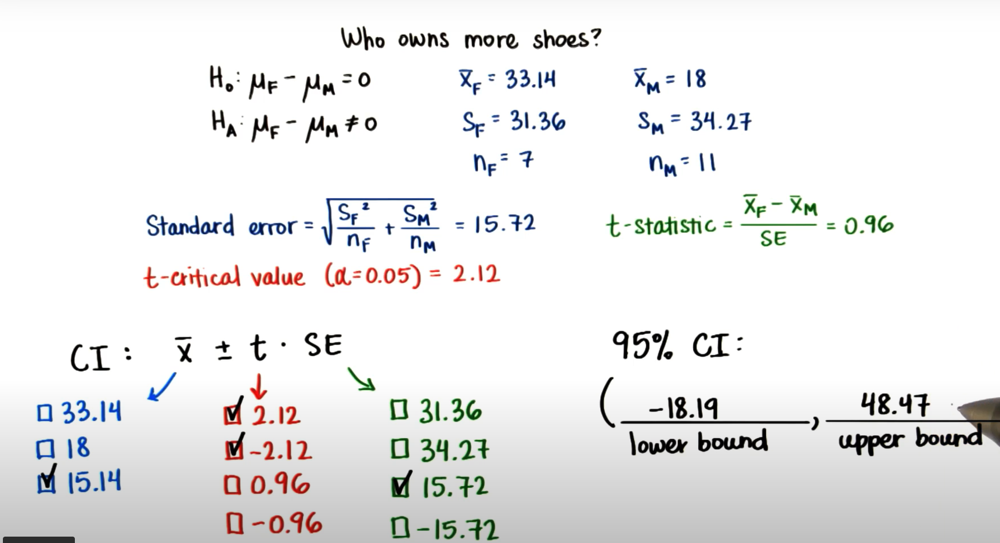

* use positive value of xbar difference ??? 
* xbar positive +-t_critical * SE(standard_err)

In [22]:
xbar_diff = shoe_f_xbar -shoe_m_xbar
xbar_diff

15.14

In [23]:
upper = xbar_diff + t_critical*standard_err
upper

48.4664

In [24]:
lower = xbar_diff -t_critical*standard_err
lower

-18.1864

In [26]:
interval= stats.t.interval(alpha=0.95,df=df,loc=xbar_diff,scale=standard_err)
interval

(-18.184911303754298, 48.4649113037543)

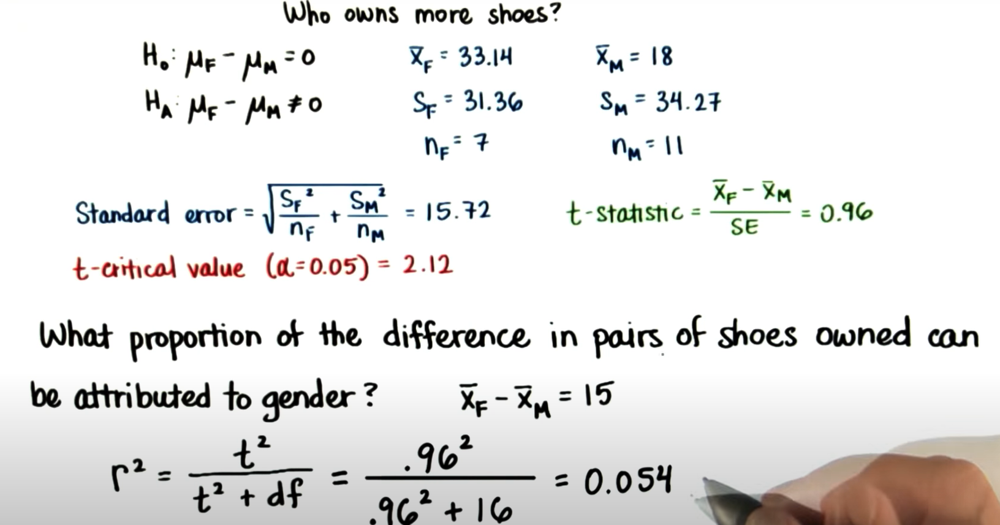

In [78]:
xbar_diff = shoe_f_xbar -shoe_m_xbar
xbar_diff

15.143

In [80]:
t_stats

0.963

# How much of this difference can be explained by the fact that some are males and some are females?

# Only 5% of the difference in shoes owned is due to gender. other 95% can be explained by something else. (we are not sure what it is , need more tests to find out.)

In [84]:
r2=(t_stats**2)/((t_stats**2) +df)
r2

0.055

# Standard error independent

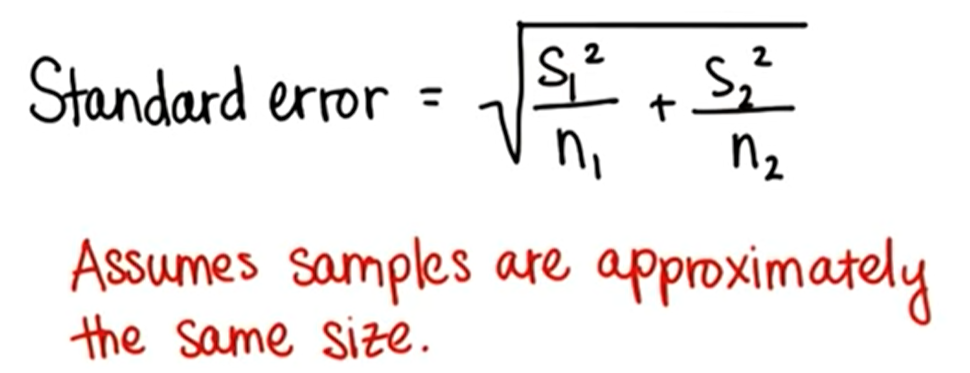

# Variance = s2

* the sum of squared devided by degree of freedom
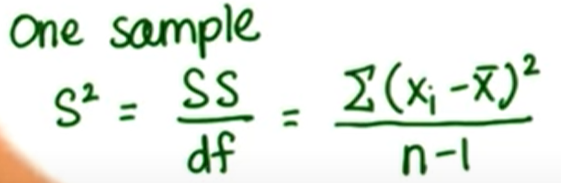

# Pooled variance

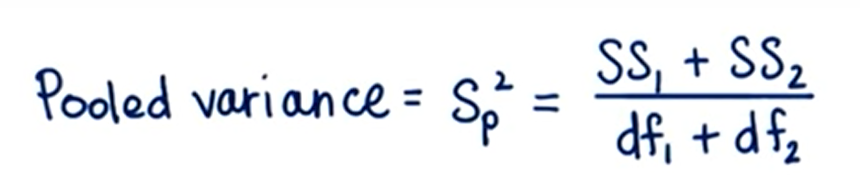

# Pooled variance

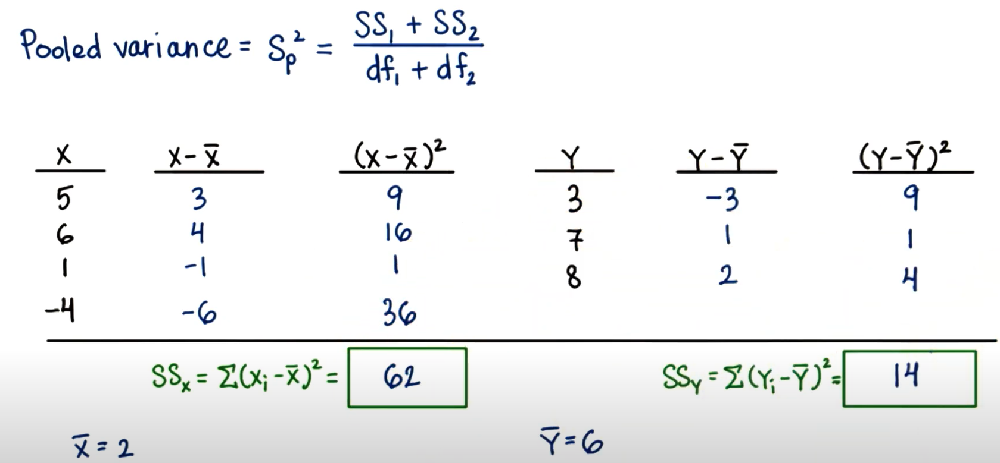

In [31]:
x=np.array([5,6,1,-4])
x

array([ 5,  6,  1, -4])

In [33]:
xbar=sum(x)/len(x)
xbar

2.0

In [36]:
(x-xbar)**2

array([ 9., 16.,  1., 36.])

In [40]:
sum_sqrt_x=sum((x-xbar)**2)
sum_sqrt_x

62.0

In [42]:
y=np.array([3,7,8])
y

array([3, 7, 8])

In [43]:
ybar=sum(y)/len(y)
ybar

6.0

In [44]:
(y-ybar)**2

array([9., 1., 4.])

In [46]:
sum_sqrt_y=sum((y-ybar)**2)
sum_sqrt_y

14.0

In [48]:
pooled_var=(sum_sqrt_x+sum_sqrt_y)/(len(x) + len(y)-2)
pooled_var

15.2

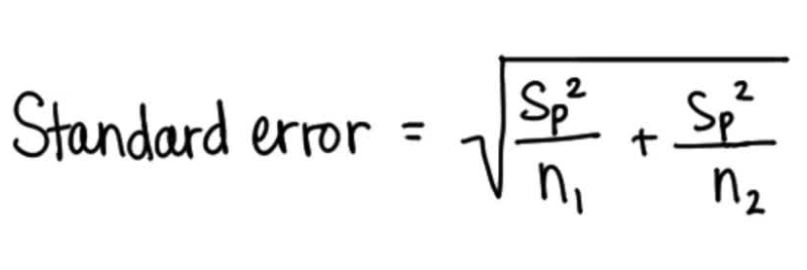

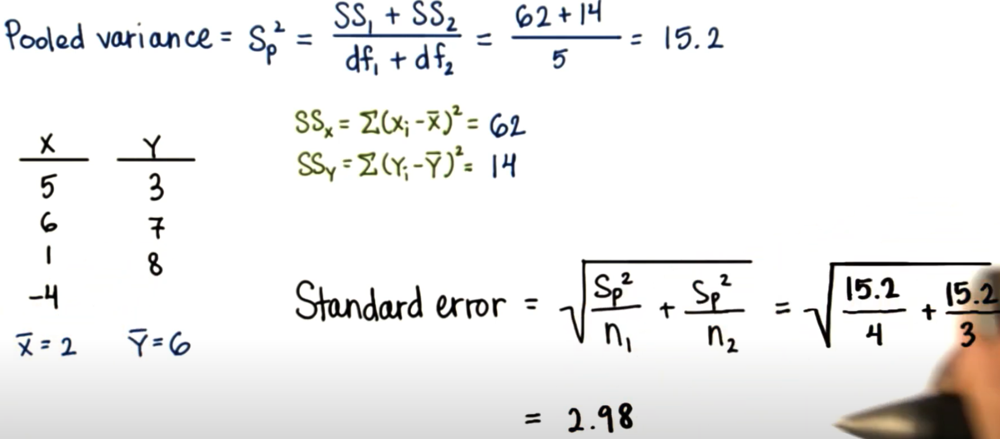

In [49]:
standard_err=sp.sqrt(pooled_var/len(x)+pooled_var/len(y))
standard_err

C:\Users\yuka\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: scipy.sqrt is deprecated and will be removed in SciPy 2.0.0, use numpy.lib.scimath.sqrt instead
  """Entry point for launching an IPython kernel.


2.9776948578836393

# T-statistic

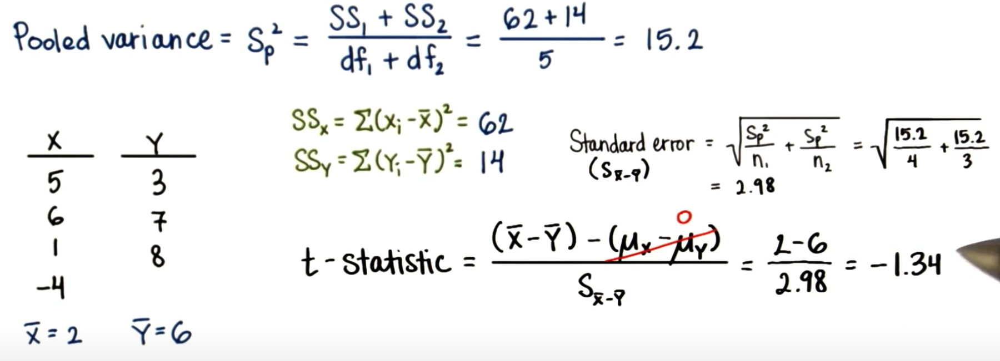

In [50]:
t_stats=(xbar-ybar)/standard_err
t_stats

-1.343320988518935

# Reject or fail t reject? 

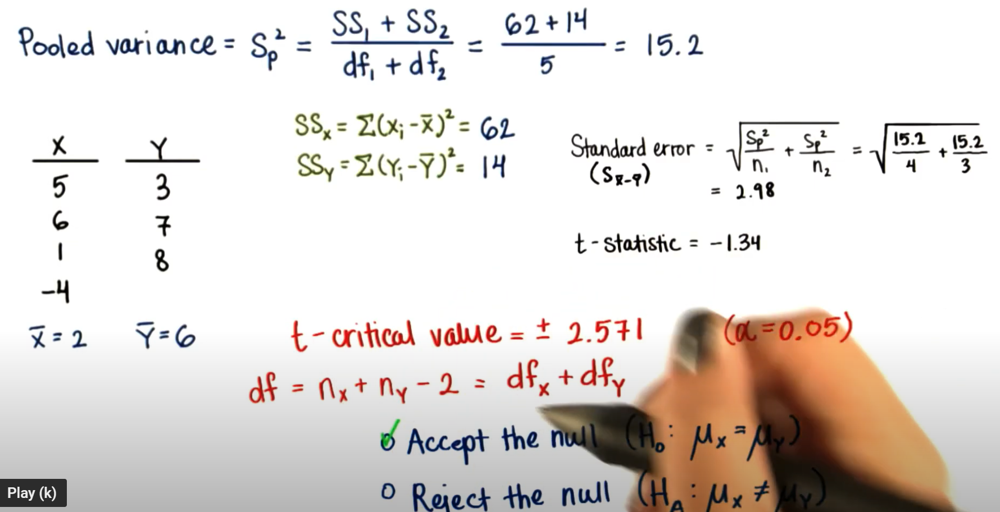

* x's sample size is 4
* y's sample size is 3 
* df = 4 + 3 -2 = 5
* find t critical value on t-table. alpha 0.05 of 2 tailed test(meaning 0.25) and df 5

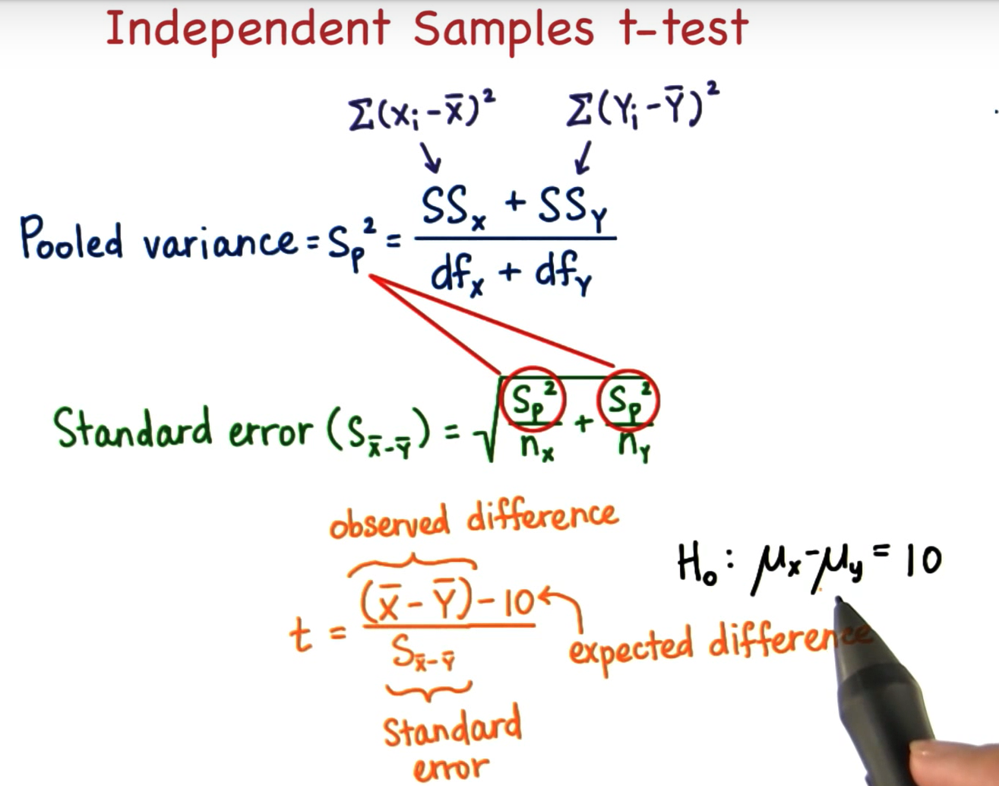

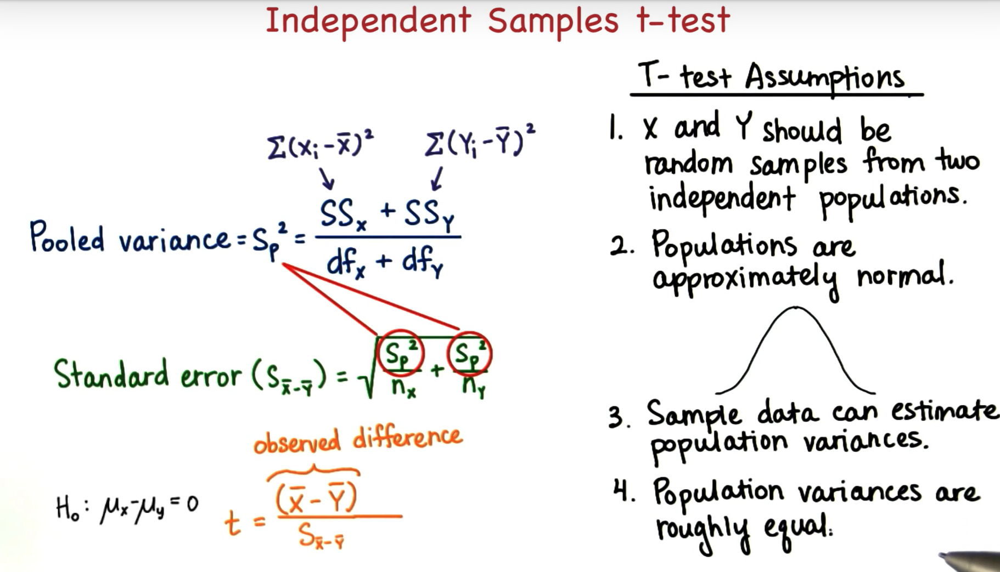

* "Independent" samples test: 2 samples come from **different groups**. 
    - "Dependent" samples test : 2 samples come from the same group.
* Population of x and y (2 groups of sample) should be **normal**